In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
import seaborn as sns
from PIL import Image
from tqdm import tqdm_notebook as tqdm

In [2]:
# Path of the folder data
!ls -lh ../data/raw/vehicle

total 8,0K
drwxr-xr-x 5 christian christian 4,0K oct 29 22:30 test
drwxr-xr-x 3 christian christian 4,0K oct 19 20:52 train


In [3]:
# Path of train data
!ls -lh ../data/raw/vehicle/train/train

total 1,1M
drwxr-xr-x 2 christian christian  12K oct 27 00:20 Ambulance
drwxr-xr-x 2 christian christian  64K sep 25 21:33 Bicycle
drwxr-xr-x 2 christian christian 284K oct 26 17:29 Boat
drwxr-xr-x 2 christian christian  72K oct 26 18:50 Bus
drwxr-xr-x 2 christian christian 252K sep 25 21:33 Car
drwxr-xr-x 2 christian christian  28K sep 25 21:33 Helicopter
drwxr-xr-x 2 christian christian 4,0K oct 26 11:05 Limousine
drwxr-xr-x 2 christian christian 116K oct 26 19:02 Motorcycle
drwxr-xr-x 2 christian christian  20K oct 27 00:26 PickUp
drwxr-xr-x 2 christian christian 4,0K oct 26 19:14 Segway
drwxr-xr-x 2 christian christian 4,0K sep 25 21:34 Snowmobile
drwxr-xr-x 2 christian christian  12K sep 25 21:34 Tank
drwxr-xr-x 2 christian christian  32K sep 25 21:34 Taxi
drwxr-xr-x 2 christian christian  68K oct 27 00:36 Truck
drwxr-xr-x 2 christian christian  36K oct 27 10:06 Van


In [4]:
# Path of test data
!ls -lh ../data/raw/vehicle/test/testset | head -5

total 1,6G
-rw-rw-r-- 1 christian christian  89K nov  4  2019 000001.jpg
-rw-rw-r-- 1 christian christian 691K nov  4  2019 000003.jpg
-rw-rw-r-- 1 christian christian  72K nov  4  2019 000005.jpg
-rw-rw-r-- 1 christian christian 467K nov  4  2019 000006.jpg
ls: error de escritura: Tubería rota


In [5]:
# I create a dataframe with class and file paths for all images on train folder
root_train = '../data/raw/vehicle/train/train'
data_train = []

In [6]:
for category in sorted(os.listdir(root_train)):
    for file in sorted(os.listdir(os.path.join(root_train, category))):
        data_train.append((category, os.path.join(root_train, category, file)))

In [7]:
train_df = pd.DataFrame(data_train, columns=['class','file_path'])

In [8]:
train_df.head()

,class,file_path
0,Ambulance,../data/raw/vehicle/train/train/Ambulance/0000...
1,Ambulance,../data/raw/vehicle/train/train/Ambulance/0000...
2,Ambulance,../data/raw/vehicle/train/train/Ambulance/0000...
3,Ambulance,../data/raw/vehicle/train/train/Ambulance/0000...
4,Ambulance,../data/raw/vehicle/train/train/Ambulance/0000...


In [9]:
print(f'There are {len(train_df)} images on train folder')

There are 27290 images on train folder


In [10]:
# I create a dataframe with file paths for all images on test folder
root_test = '../data/raw/vehicle/test/testset'
data_test = []

In [11]:
for file in sorted(os.listdir(root_test)):
    data_test.append(file)

In [12]:
test_df = pd.DataFrame(data_test, columns=['file_path'])

In [13]:
test_df.head()

,file_path
0,000001.jpg
1,000003.jpg
2,000005.jpg
3,000006.jpg
4,000007.jpg


In [14]:
print(f'There are {len(test_df)} images on test folder')

There are 6236 images on test folder


In [15]:
train_df['class']

0        Ambulance
1        Ambulance
2        Ambulance
3        Ambulance
4        Ambulance
           ...    
27285          Van
27286          Van
27287          Van
27288          Van
27289          Van
Name: class, Length: 27290, dtype: object

In [16]:
train_df['class'].value_counts()

Boat          8892
Car           6781
Motorcycle    2918
Bus           2083
Bicycle       1618
Truck         1365
Van           1061
Taxi           748
Helicopter     668
PickUp         418
Tank           206
Ambulance      184
Segway         152
Snowmobile     123
Limousine       73
Name: class, dtype: int64

Text(0.5, 1.0, 'Types of vehicles')

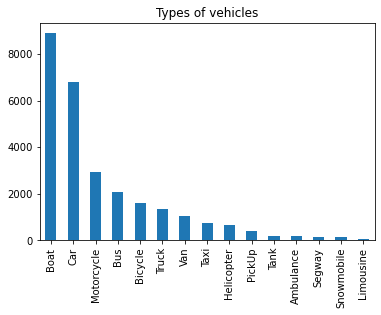

In [17]:
train_df['class'].value_counts().plot(kind='bar')
plt.title('Types of vehicles')

The dataset is highly imbalanced, there exist 8892 images of boat class and only 73 images of limousine class.

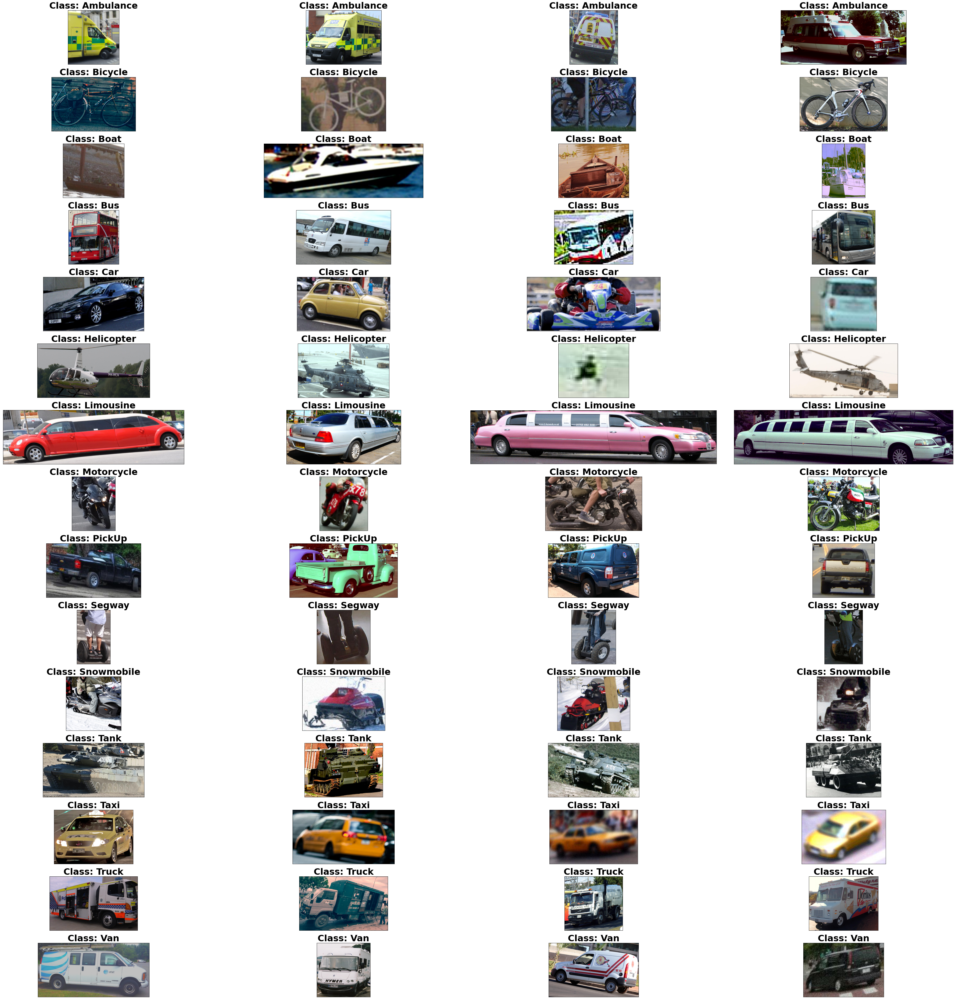

In [18]:
# I plot few images of each category to see what the images look like.

fig = plt.figure(figsize=(50, 50))
for num, category in enumerate(sorted(train_df['class'].unique())):
    for i, (idx, row) in enumerate(train_df.loc[train_df['class'] == category].sample(4).iterrows()):
        ax = fig.add_subplot(15, 4, num * 4 + i + 1, xticks=[], yticks=[])
        im = Image.open(row['file_path'])
        plt.imshow(im)
        ax.set_title(f'Class: {category}', fontsize=32, weight="bold")
fig.tight_layout()
plt.show()

In [19]:
weights = defaultdict(lambda: defaultdict(list))
for idx, row in tqdm(train_df.iterrows(), total=len(train_df)):
    image = Image.open(row[1])
    weights[row[0]]['width'].append(image.size[0])
    weights[row[0]]['height'].append(image.size[1])

/home/christian/miniconda3/envs/ironhack_env/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


In [20]:
def plot_dist(category):
    '''plot height/width dist curves for given category'''
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.distplot(weights[category]['height'], color='darkorange', ax=ax).set_title(category, fontsize=16)
    sns.distplot(weights[category]['width'], color='purple', ax=ax).set_title(category, fontsize=16)
    plt.xlabel('size', fontsize=15)
    plt.legend(['height', 'width'])
    plt.show()

In [21]:
weights

defaultdict(<function __main__.<lambda>()>,
            {'Ambulance': defaultdict(list,
                         {'width': [1292,
                           1294,
                           1898,
                           1881,
                           1082,
                           2955,
                           1437,
                           1945,
                           2269,
                           3338,
                           1488,
                           1258,
                           2323,
                           3308,
                           2236,
                           2061,
                           1417,
                           2499,
                           1464,
                           3076,
                           2655,
                           1339,
                           2149,
                           2077,
                           966,
                           2748,
                           798,
              

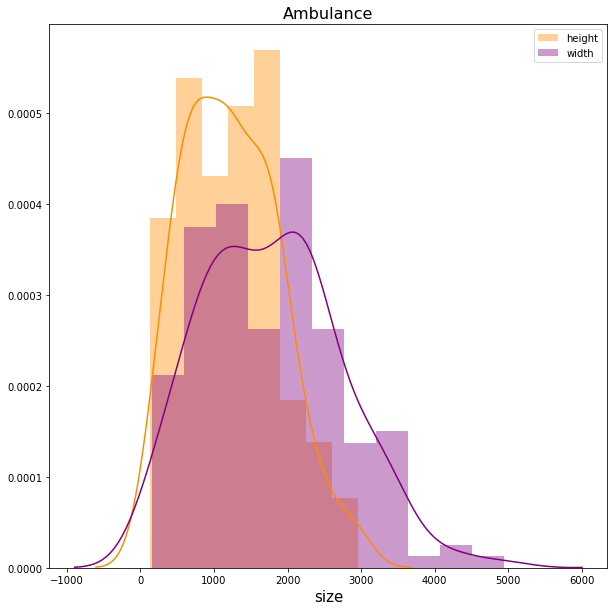

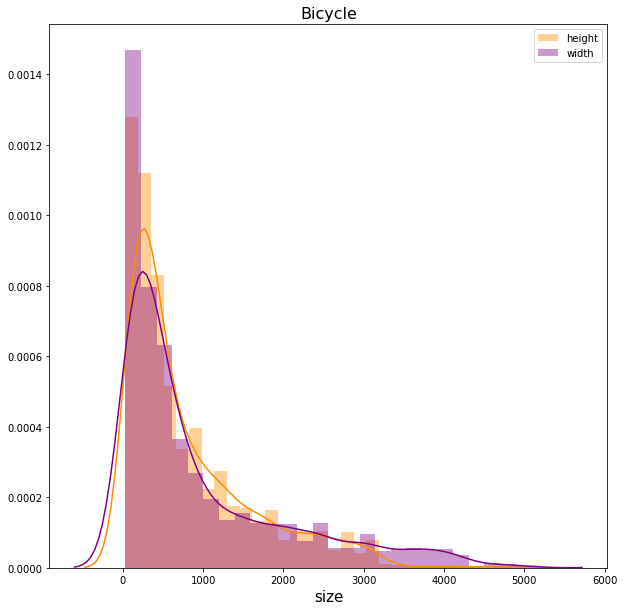

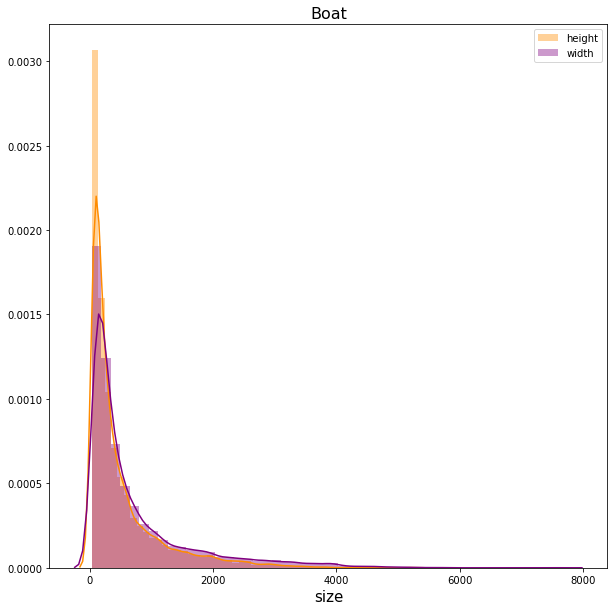

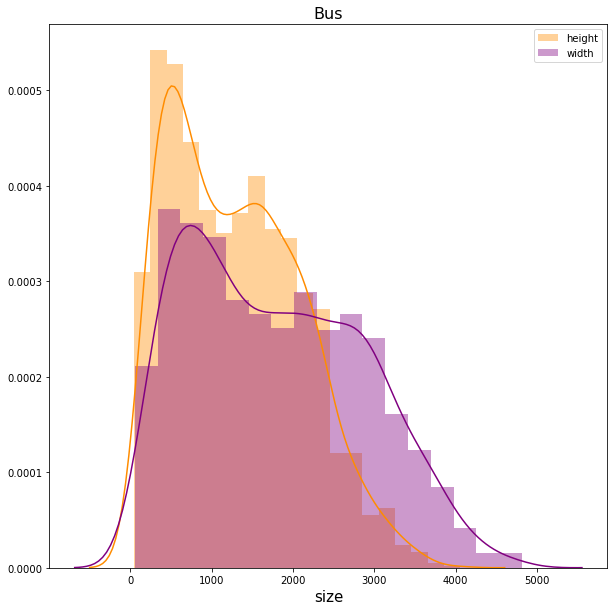

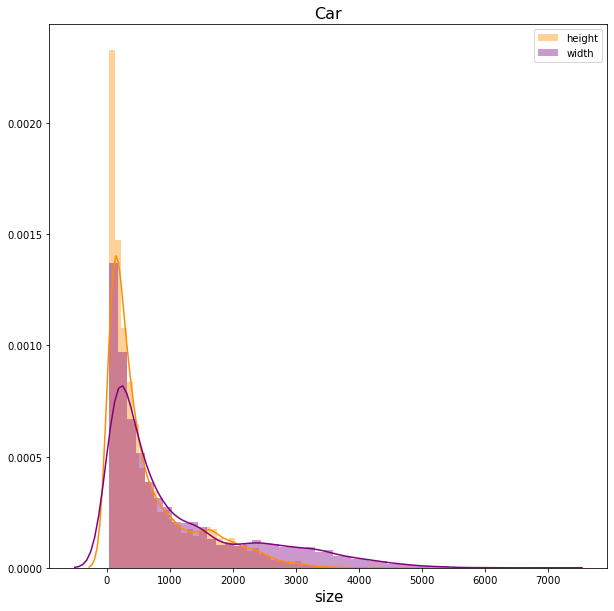

...

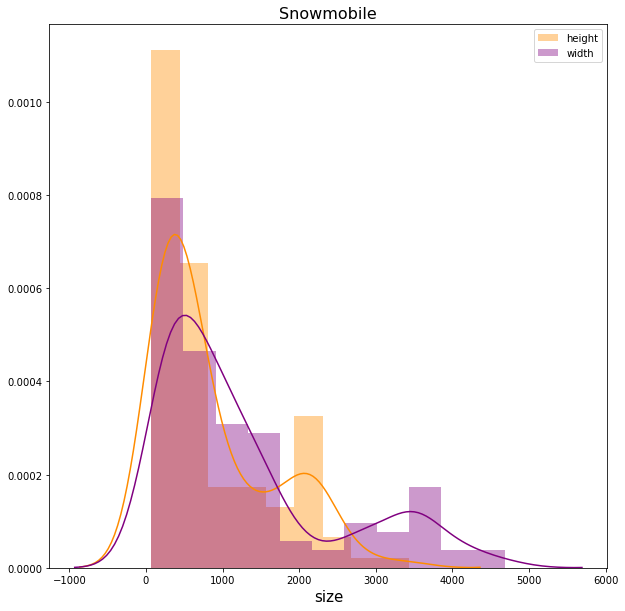

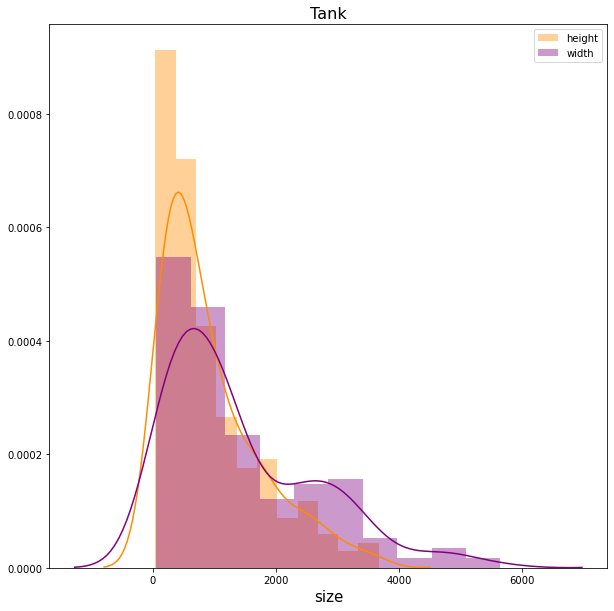

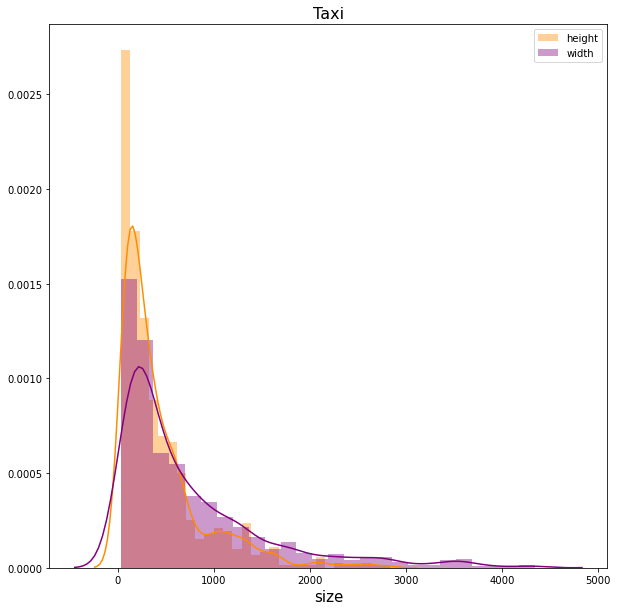

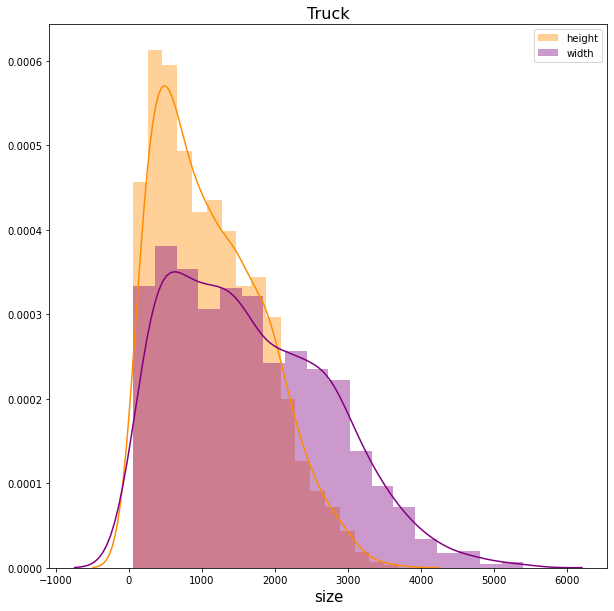

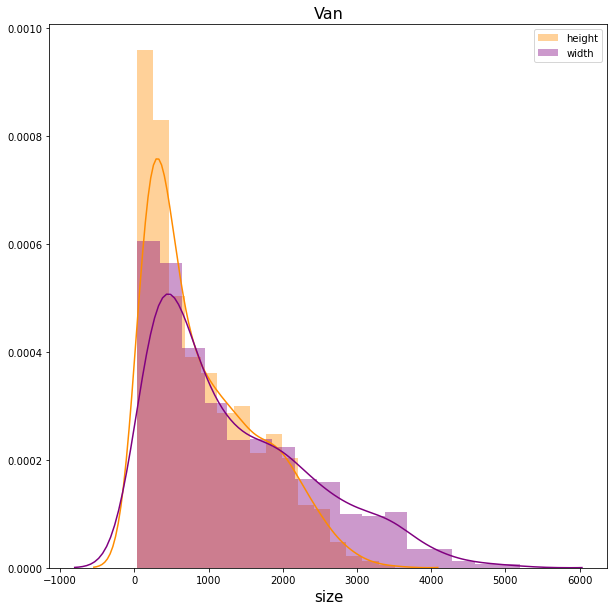

In [22]:
for category in train_df['class'].unique():
    plot_dist(category)

### Anotaciones a tener en cuenta

- modelos preentrenados con fastest. Transfer learning es coger un modelo para clasificar otras categorías diferentes (red preentrenadas quitando las últimas capas)
- quitar las últimas capas para entrenar sobre algo que ya funcionaba muy bien. ImageNet está entrenada con billones de imágenes (probar)
- En la página de tensorflow hay ejemplos keras.
- keras image generator que con un tipo de vehículo genera nuevas imagenes por rotación
- mirar en keras un módulo que lee archivos
- empezar a ver el resize de las imágenes. Generar una función para tener todas las imágenes a 200x200 por ejemplo.
- Se puede hacer una media del tamaño de las imágenes para poder mantener la proporción lo mas parecida posible y tener todas las imágenes del dataset al mismo tamaño
- en el preprocesamiento de los datos haremos un balance del dataset